In [1]:
# library preparations
import scipy.io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import joblib
import seaborn as sns
import time

In [2]:
# Read in Data
load_train = np.load('./data/train.npz', allow_pickle=True)
load_test = np.load('./data/test_large.npz', allow_pickle=True)
X_train, y_train = load_train['X_train'], load_train['y_train']
X_test, y_test = load_test['X_test_large'], load_test['y_test_large']

samples, rows, cols = X_train.shape

print("Before flattening:")
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

Before flattening:
(6500, 460, 12)
(6500, 1)
(6499, 460, 12)
(6499, 1)


Performing PCA on sample  999
Variance explained in PCs [0.542 0.249 0.202 0.006 0.001 0.    0.    0.    0.    0.    0.    0.   ]


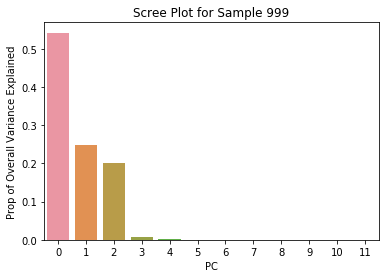

In [3]:
from sklearn.decomposition import PCA
from random import randrange

# dimensionality reduction
pca = PCA()
sel = randrange(0, X_train.shape[0])
print("Performing PCA on sample ", sel)
pcs = pca.fit_transform(X_train[sel, :, :])
varprop = pca.explained_variance_ratio_ # scree plot
num_pc = pca.n_components_ # eigenvectors 
features_index = pd.Series(list(range(1, num_pc+1)))

print("Variance explained in PCs", varprop.round(3))
# print("Eigen vectors", pca.components_)

%matplotlib inline
# Creating a bar plot
sns.barplot(x=list(range(0, pca.n_components_)), y=varprop)
# Add labels to your graph
plt.xlabel('PC')
plt.ylabel('Prop of Overall Variance Explained')
plt.title(f"Scree Plot for Sample {sel}")
plt.show()

In [4]:
def reduce_data(data, sel, filename='./data/train_reduced.npz'):
    """
    data: collection of data to be reduced down
    filename: save file name of np object
    """
    # important: NEED TO SCALE FOR PCA
    from sklearn.preprocessing import scale

    samples, rows, cols = data.shape
    # do first sample, then concatenate
    pca = PCA()
    # take the first 3 columns of the transformed score
    data_reduced = pca.fit_transform(scale(data[0,:,:]))[:, :sel]
    for i in range(1, samples):
        temp = pca.fit_transform(scale(data[i,:,:]))[:, :sel]
        data_reduced = np.concatenate((data_reduced, temp), axis=0)
    
    print("Before compression ", data_reduced.shape)

    data_reduced = data_reduced.reshape(samples, rows, sel)
    print("After compression ", data_reduced.shape)

    # store the result into a numpy object
    np.savez_compressed(filename, data_reduced = data_reduced)

sel = 3
reduce_data(X_train, sel, filename=f'./data/train_reduced_pc={sel}.npz')
reduce_data(X_test, sel, filename=f'./data/test_reduced_pc={sel}.npz')

Before compression  (2990000, 3)
After compression  (6500, 460, 3)
Before compression  (2989540, 3)
After compression  (6499, 460, 3)


# RF with PCA on Individual Samples

1. Apply PCA to each sample (simulation) independently, extract the top 3 PCs and their respective scores
    + Note: could try just PC1 as well
2. Flatten the dataset to fit input criteria
3. Apply Random Forest on this now reduced dimension dataset 

In [5]:
# Run PCA on each sample and take the top sel pcs
load_train_reduced = np.load(f'./data/train_reduced_pc={sel}.npz', 
                             allow_pickle=True)
load_test_reduced = np.load(f'./data/test_reduced_pc={sel}.npz', 
                             allow_pickle=True)
X_train = load_train_reduced['data_reduced']
X_test = load_test_reduced['data_reduced']

samples, rows, cols = X_train.shape
print(X_train.shape)
print(X_test.shape)

# flatten data 
y_train = y_train.reshape(y_train.shape[0], )
y_test = y_test.reshape(y_test.shape[0], )
X_train = X_train.reshape(X_train.shape[0], -1)
X_test = X_test.reshape(X_test.shape[0], -1)

print("After flattening:")
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(6500, 460, 3)
(6499, 460, 3)
After flattening:
(6500, 1380)
(6500,)
(6499, 1380)
(6499,)


In [6]:
# Prepare for K fold cross validation
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import precision_score, recall_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score

k = 10
# again, random_state for sake of reproducibility
kf = KFold(n_splits=k, random_state = 42, shuffle=True)

# default confusion matrix 
# we can calculate TP, FP, FN, TN from this matrix at the end
matrix = pd.DataFrame(0, index=['True Yes', 'True No', ''], 
                      columns=['Pred Yes', 'Pred No', ''])

start = time.time()
for train_index, test_index in kf.split(X_train):
    # identify the train and test set within each fold
    X_fold_train, X_fold_test = X_train[train_index], X_train[test_index]
    y_fold_train, y_fold_test = y_train[train_index], y_train[test_index]
    
    # fit the model on the training set
#     model = RandomForestClassifier(n_estimators=500, oob_score=True, 
#                                min_samples_leaf = 10, max_depth = 3, 
#                                min_samples_split = 100, max_leaf_nodes = 50,
#                                max_features = 'sqrt', n_jobs=8)

    model = RandomForestClassifier(n_estimators=500, oob_score=True,
                                   max_features = 'sqrt', n_jobs=8)
    model.fit(X_fold_train, y_fold_train)

    # predict label on validation test set, record results
    y_pred = model.predict(X_fold_test)
    y_prob = model.predict_proba(X_fold_test)[:,1]

    # collect metrics
    m = pd.crosstab(y_pred, y_fold_test, margins=True)
    m.index = ['True Yes', 'True No', '']
    m.columns = ['Pred Yes', 'Pred No', '']
    matrix += m

end = time.time()
print('Time taken:', end - start)
print(matrix)
TP, FN = matrix.iloc[0, 0], matrix.iloc[0, 1]
FP, TN = matrix.iloc[1, 0], matrix.iloc[1, 1]
total = TP + FN + FP + TN
print("Accuracy: \t\t\t\t\t\t\t", (TP + TN) / total)
print("Error Rate: \t\t\t\t\t\t\t", (FN + FP) / total)
recall = TP / (TP + FN)
print("True Positive Rate (TPR) | Sensitivity | Recall | Coverage\t", recall)
print("True Negative Rate (TNR) | Specificity \t\t\t\t", 
      TN / (FP + TN))
print("False Positive Rate (FPR) is \t\t\t\t\t", FP / (FP + TN))
print("False Negative Rate (FNR) is \t\t\t\t\t", FN / (TP + FN))
precision = TP / (TP + FP)
print("Average Precision: \t\t\t\t\t\t", precision)
print("Average Recall: \t\t\t\t\t\t", recall)
print("Average F Measures: \t\t\t\t\t\t", 
      (2*precision*recall) / (precision+recall))
pred_prob = model.predict_proba(X_train)[:, 1]
print("Average AUC: \t\t\t\t\t\t\t", roc_auc_score(y_train, pred_prob))

Time taken: 94.89115381240845
          Pred Yes  Pred No      
True Yes      1762      337  2099
True No        683     3718  4401
              2445     4055  6500
Accuracy: 							 0.8430769230769231
Error Rate: 							 0.15692307692307692
True Positive Rate (TPR) | Sensitivity | Recall | Coverage	 0.8394473558837542
True Negative Rate (TNR) | Specificity 				 0.8448079981822313
False Positive Rate (FPR) is 					 0.15519200181776868
False Negative Rate (FNR) is 					 0.16055264411624584
Average Precision: 						 0.7206543967280163
Average Recall: 						 0.8394473558837542
Average F Measures: 						 0.7755281690140844
Average AUC: 							 0.998792321328159


In [7]:
model = RandomForestClassifier(n_estimators=500, oob_score=True,
                               max_features = 'sqrt', n_jobs=8)
start = time.time()
model.fit(X_train, y_train)
end = time.time()
print('Time taken:', end - start)

# save the model
joblib.dump(model, "./data/random_forest_reduced_6500.joblib")

Time taken: 10.457535743713379


['./data/random_forest_reduced_6500.joblib']

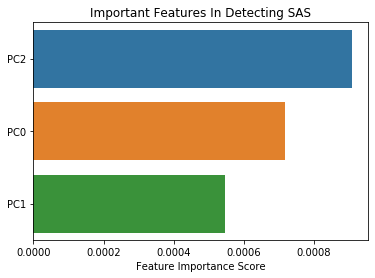

In [8]:
features_index = ["PC" + str(ind) for ind in list(range(0, sel))]

features = model.feature_importances_.reshape(rows, cols).mean(axis=0)
feature_imp = pd.Series(features,index=features_index).sort_values(
    ascending=False)

%matplotlib inline
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.title("Important Features In Detecting SAS")
plt.show()

In [9]:
from random import randrange

# Extract single tree
rand = randrange(0, model.n_estimators)
print(f"Tree {rand}")
estimator = model.estimators_[203]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = features_index * rows,
                class_names = ["SAS", "Neutral"],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

Tree 257


## Test Set Evaluation

Below are peformance measures on the test set never touched during model building

In [10]:
y_pred = model.predict(X_test)
print("Accuracy on Test Set:", accuracy_score(y_test,y_pred))
print(f'Our OOB prediction of accuracy is: {model.oob_score_ * 100}%')

# show stats
matrix = pd.crosstab(y_pred, y_test, margins=True)
matrix.index = ['True Yes', 'True No', '']
matrix.columns = ['Pred Yes', 'Pred No', '']
print(matrix)

TP, FN = matrix.iloc[0, 0], matrix.iloc[0, 1]
FP, TN = matrix.iloc[1, 0], matrix.iloc[1, 1]
total = TP + FN + FP + TN
print("Accuracy: \t\t\t\t\t\t\t", (TP + TN) / total)
print("Error Rate: \t\t\t\t\t\t\t", (FN + FP) / total)
print("True Positive Rate (TPR) | Sensitivity | Recall | Coverage\t", 
      TP / (TP + FN))
print("True Negative Rate (TNR) | Specificity \t\t\t\t", 
      TN / (FP + TN))
print("False Positive Rate (FPR) is \t\t\t\t\t", FP / (FP + TN))
print("False Negative Rate (FNR) is \t\t\t\t\t", FN / (TP + FN))
precision = TP / (TP + FP)
recall = TP / (TP + FN)
print("Average Precision: \t\t\t\t\t\t", precision)
print("Average F Measures: \t\t\t\t\t\t", 
      (2*recall*precision) / (recall + precision))
pred_prob = model.predict_proba(X_test)[:, 1]
print("Average AUC: \t\t\t\t\t\t\t", roc_auc_score(y_test, pred_prob))

Accuracy on Test Set: 0.4940760116941068
Our OOB prediction of accuracy is: 83.95384615384616%
          Pred Yes  Pred No      
True Yes      1228     1216  2444
True No       2072     1983  4055
              3300     3199  6499
Accuracy: 							 0.4940760116941068
Error Rate: 							 0.5059239883058932
True Positive Rate (TPR) | Sensitivity | Recall | Coverage	 0.502454991816694
True Negative Rate (TNR) | Specificity 				 0.48902589395807644
False Positive Rate (FPR) is 					 0.5109741060419235
False Negative Rate (FNR) is 					 0.49754500818330605
Average Precision: 						 0.37212121212121213
Average F Measures: 						 0.4275766016713092
Average AUC: 							 0.4992632640882094


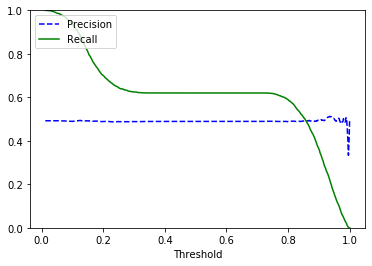

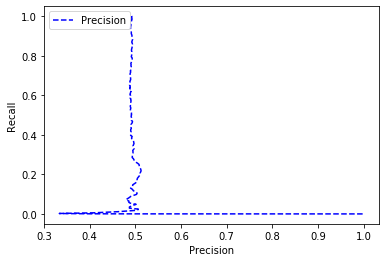

In [11]:
from sklearn.metrics import precision_recall_curve

# precision recall curve for training set 
y_prob = model.predict_proba(X_test)[:,1]
precisions, recalls, thresholds = precision_recall_curve(
    y_test, y_prob, pos_label = "Yes")

def plot_precision_recall_vs_threshold(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
    plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.ylim([0, 1])

plot_precision_recall_vs_threshold(precisions, recalls, thresholds)
plt.show()

plt.plot(precisions, recalls, "b--", label="Precision")
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.legend(loc="upper left")
plt.show()

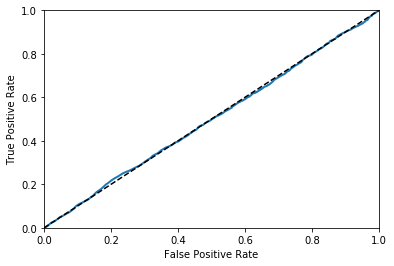

The AUC is  0.4992632640882094


In [12]:
# ROC Curve
# The more the area under the curve the better our classifier
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob, pos_label = "Yes")
def plot_roc_curve(fpr, tpr, label=None):
    plt.plot(fpr, tpr, linewidth=2, label=label)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([0, 1, 0, 1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')

plot_roc_curve(fpr, tpr, "Random Forest")
plt.show()

from sklearn.metrics import roc_auc_score
print("The AUC is ", roc_auc_score(y_test, y_prob))